In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader, Dataset, ConcatDataset
from PIL import Image, UnidentifiedImageError
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    confusion_matrix,
    ConfusionMatrixDisplay,
)
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import BinaryClassifierOutputTarget


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Selection trained classifier
--> Using Resnet50

In [2]:
train_mean = 0.606
train_std = 0.1944


class SafeImageFolder(Dataset):
    def __init__(self, root, transform=None):
        self.dataset = datasets.ImageFolder(root=root, transform=transform)
        self.transform = transform
        self.valid_indices = []
        for i in range(len(self.dataset)):
            path, _ = self.dataset.samples[i]
            try:
                with open(path, "rb") as f:
                    Image.open(f).verify()
                self.valid_indices.append(i)
            except (UnidentifiedImageError, OSError):
                print(f"Skipping corrupted image: {path}")

        self.classes = self.dataset.classes
        self.class_to_idx = self.dataset.class_to_idx
        self.targets = [self.dataset.targets[i] for i in self.valid_indices]

    def __len__(self):
        return len(self.valid_indices)

    def __getitem__(self, idx):
        return self.dataset[self.valid_indices[idx]]


val_test_transform = transforms.Compose(
    [
        transforms.Grayscale(num_output_channels=3),
        transforms.Resize((128, 128)),
        transforms.ToTensor(),
        transforms.Normalize(
            mean=[train_mean, train_mean, train_mean],
            std=[train_std, train_std, train_std],
        ),
    ]
)

test_dataset = SafeImageFolder(
    root="data_project_gray/test", transform=val_test_transform
)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

In [3]:
# Recreate model architecture (same as training)
model = models.resnet50()

num_features = model.fc.in_features
model.fc = nn.Sequential(
    nn.Dropout(p=0.5),
    nn.Linear(num_features, 1)
)

# Load trained weights
model.load_state_dict(torch.load("resnet50_finetuned_best.pth", map_location=device))
model = model.to(device)
model.eval()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [4]:
def calculate_metrics(loader, model, threshold=0.5):
    model.eval()
    all_probs, all_labels = [], []
    with torch.no_grad():
        for X, y in loader:
            X = X.to(device)

            y = y.to(device).float().unsqueeze(1)  # Make sure labels have good size

            logits = model(X)
            probs = torch.sigmoid(logits).cpu().numpy()
            all_probs.extend(probs)
            all_labels.extend(y.cpu().numpy())

    all_probs = np.array(all_probs)
    all_labels = np.array(all_labels)
    all_preds = (all_probs >= threshold).astype(int)

    return {
        "accuracy": accuracy_score(all_labels, all_preds),
        "precision": precision_score(all_labels, all_preds, zero_division=0),
        "recall": recall_score(all_labels, all_preds, zero_division=0),
        "f1": f1_score(all_labels, all_preds, zero_division=0),
        "auc": roc_auc_score(all_labels, all_probs),
    }

metrics = calculate_metrics(test_loader, model)

print("\n--- TEST PARAMETERS ---")
# print(f"Accuracy:  {metrics['accuracy']:.4f}")
print(f"Precision: {metrics['precision']:.4f}")
print(f"Recall:    {metrics['recall']:.4f}")
print(f"F1-score:  {metrics['f1']:.4f}")
print(f"AUC (ROC): {metrics['auc']:.4f}")

# results should be:
# Precision: 0.9388
# Recall:    0.9200
# F1-score:  0.9293
# AUC (ROC): 0.9938


--- TEST PARAMETERS ---
Precision: 0.9388
Recall:    0.9200
F1-score:  0.9293
AUC (ROC): 0.9938


Comparing these test results, they have the same values as in task 3, so the model is loaded in succesfully

# Implementation Grad-CAM

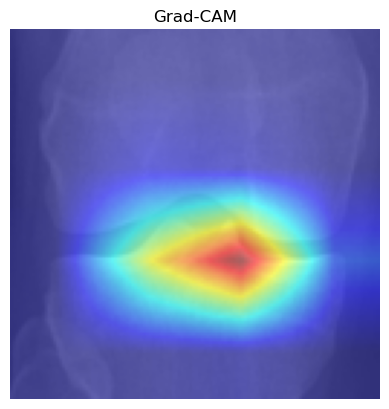

In [131]:
target_layers = [model.layer4[-1]]

images, labels = next(iter(test_loader))
img = images[4]
rgb_img = img.permute(1, 2, 0).numpy()
# unnormalise image for visualization
mean = np.array([0.606]*3)
std = np.array([0.1944]*3)
rgb_img = std * rgb_img + mean
rgb_img = np.clip(rgb_img, 0, 1)
input_tensor = img.unsqueeze(0).to(device)
# Note: input_tensor can be a batch tensor with several images!

# We have to specify the target we want to generate the CAM for.
targets = [BinaryClassifierOutputTarget(0)]

# Construct the CAM object once, and then re-use it on many images.
with GradCAM(model=model, target_layers=target_layers) as cam:
    # You can also pass aug_smooth=True and eigen_smooth=True, to apply smoothing.
    grayscale_cam = cam(input_tensor=input_tensor, targets=targets)
    # In this example grayscale_cam has only one image in the batch:
    grayscale_cam = grayscale_cam[0, :]

    visualization = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)

plt.imshow(visualization)
plt.axis("off")
plt.title("Grad-CAM")
plt.show()

In [132]:
# gathering some samples

correct_healthy, correct_oa, misclassified_healthy, misclassified_oa = [], [], [], []

with torch.no_grad():
    for X, y in test_loader:
        X = X.to(device)
        y = y.to(device)
        logits = model(X)
        probs = torch.sigmoid(logits).cpu().numpy()
        preds = (probs >= 0.5).astype(int)
    
        for i in range(len(X)):
            img = X[i].cpu()
            label = y[i].item()
            pred = preds[i].item()
            
            if label == 0 and pred == 0 and len(correct_healthy) < 8:
                correct_healthy.append(img)
    
            elif label == 1 and pred == 1 and len(correct_oa) < 8:
                correct_oa.append(img)
    
            elif label == 1 and pred == 0 and len(misclassified_healthy) < 4:
                misclassified_healthy.append(img)
    
            elif label == 0 and pred == 1 and len(misclassified_oa) < 4:
                misclassified_oa.append(img)

In [149]:
def get_cam(img, forced_pred=False):
    input_tensor = img.unsqueeze(0).to(device)
    targets = 0
    if forced_pred:
        # makes sure we do highlight where the model looks for signs of osteoarthritis if there aren't any 
        logits = model(input_tensor)
        prob = torch.sigmoid(logits)
        pred_class = 1 if prob.item() <= 0.5 else 0
        targets = [BinaryClassifierOutputTarget(pred_class)]
        confidence = prob.item()
    else:
        # makes sure we don't highlight where the model looks for signs of osteoarthritis if there aren't any 
        logits = model(input_tensor)
        prob = torch.sigmoid(logits)
        pred_class = 1 if prob.item() >= 0.5 else 0
        targets = [BinaryClassifierOutputTarget(pred_class)]
        confidence = prob.item()
    # create the CAM
    with GradCAM(model=model, target_layers=[model.layer4[-1]]) as cam:
        grayscale_cam = cam(input_tensor=input_tensor, targets=targets, aug_smooth=True)
        grayscale_cam = grayscale_cam[0, :]
    
    return grayscale_cam, confidence

def show_cam(img, cam):
    rgb_img = img.permute(1, 2, 0).numpy()

    # unnormalise image for visualization
    mean = np.array([0.606]*3)
    std = np.array([0.1944]*3)
    rgb_img = std * rgb_img + mean
    rgb_img = np.clip(rgb_img, 0, 1)

    visualization = show_cam_on_image(rgb_img, cam, use_rgb=True)

    plt.imshow(visualization)
    plt.axis("off")

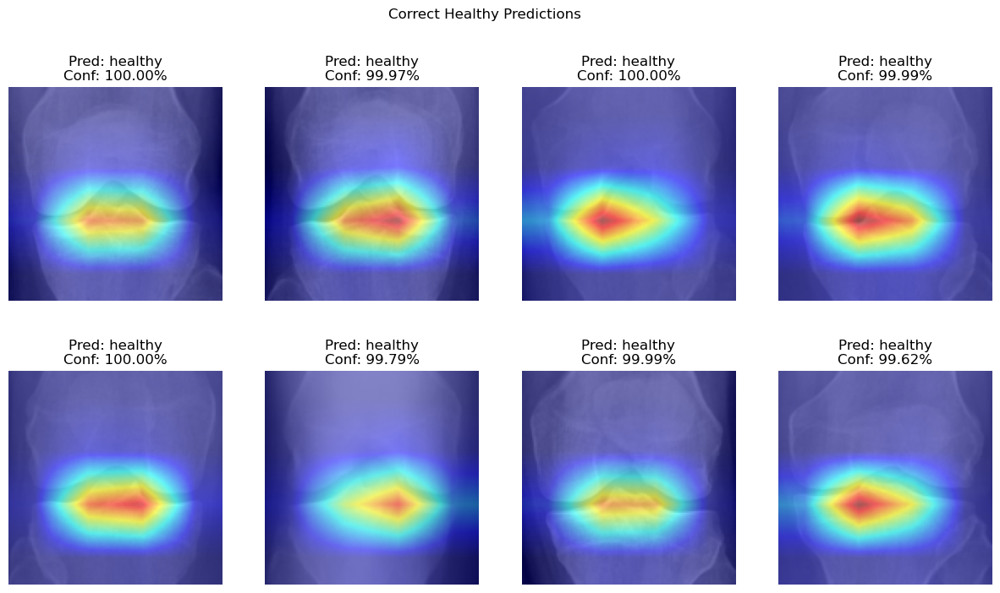

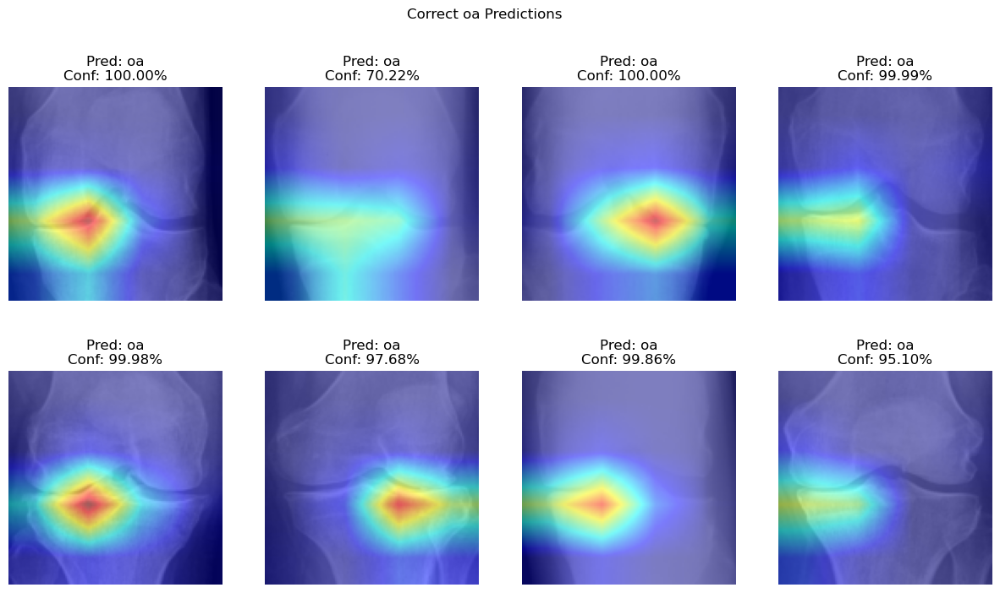

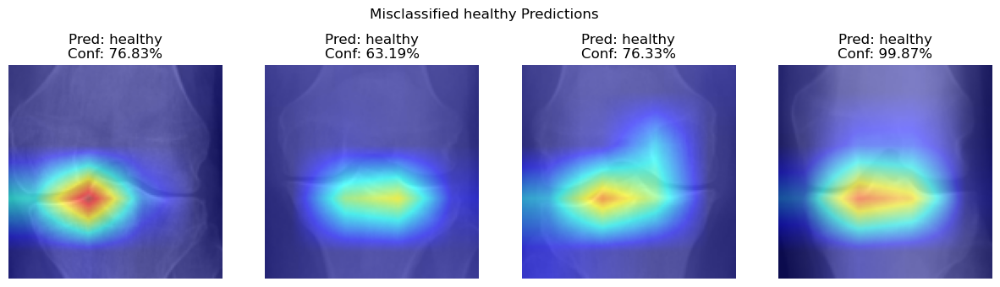

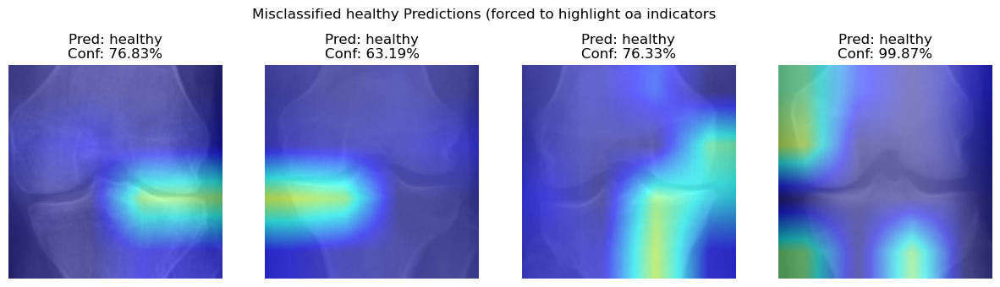

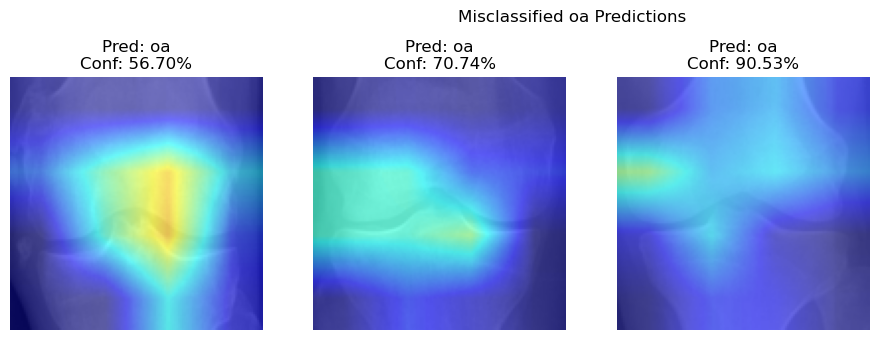

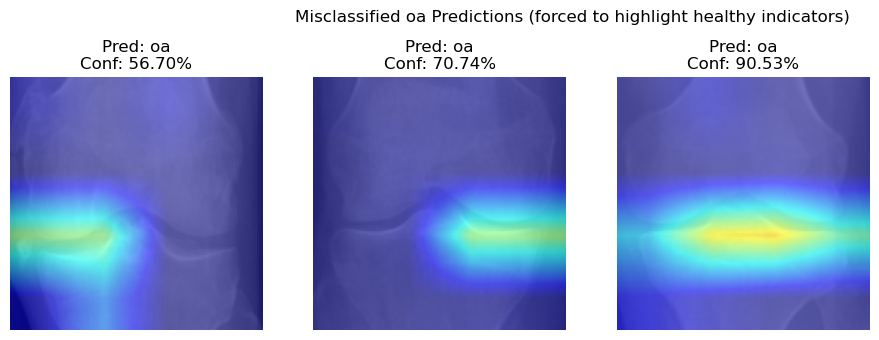

In [150]:
plt.figure(figsize=(15,8))

for i, img in enumerate(correct_healthy):
    cam, conf = get_cam(img)
    plt.subplot(2,4,i+1)
    show_cam(img, cam)
    plt.title(f"Pred: healthy\nConf: {100-conf*100:.2f}%")

plt.suptitle("Correct Healthy Predictions")
plt.show()


plt.figure(figsize=(15,8))
for i, img in enumerate(correct_oa):
    cam, conf = get_cam(img)
    plt.subplot(2,4,i+1)
    show_cam(img, cam)
    plt.title(f"Pred: oa\nConf: {conf*100:.2f}%")

plt.suptitle("Correct oa Predictions")
plt.show()


plt.figure(figsize=(15,4))
for i, img in enumerate(misclassified_healthy):
    cam, conf = get_cam(img)
    plt.subplot(1,4,i+1)
    show_cam(img, cam)
    plt.title(f"Pred: healthy\nConf: {100-conf*100:.2f}%")

plt.suptitle("Misclassified healthy Predictions")
plt.show()

plt.figure(figsize=(15,4))
for i, img in enumerate(misclassified_healthy):
    cam, conf = get_cam(img, True)
    plt.subplot(1,4,i+1)
    show_cam(img, cam)
    plt.title(f"Pred: healthy\nConf: {100-conf*100:.2f}%")

plt.suptitle("Misclassified healthy Predictions (forced to highlight oa indicators")
plt.show()

plt.figure(figsize=(15,4))
for i, img in enumerate(misclassified_oa):
    cam, conf = get_cam(img)
    plt.subplot(1,4,i+1)
    show_cam(img, cam)
    plt.title(f"Pred: oa\nConf: {conf*100:.2f}%")

plt.suptitle("Misclassified oa Predictions")
plt.show()

plt.figure(figsize=(15,4))
for i, img in enumerate(misclassified_oa):
    cam, conf = get_cam(img, True)
    plt.subplot(1,4,i+1)
    show_cam(img, cam)
    plt.title(f"Pred: oa\nConf: {conf*100:.2f}%")

plt.suptitle("Misclassified oa Predictions (forced to highlight healthy indicators)")
plt.show()

The Grad-CAM visualizations show a noticeable difference in the attention patterns of correct healthy and osteoarthritis predictions. For images that are classified as healthy, the highlighted region tends to be located more in the middle of the knee joint, but is less concentrated and spans a broader horizontal area around the joint. In contrast, for osteoarthritis classified X-rays, the model focusses more on specific parts of the knee joint and is usually concentrated on the left or right side of the knee.

These observations suggest that the model is more sensitive to localized structural anomolies like narrower space between bones, which is a characteristic indicator of osteoarhtritis.

When examining misclassified examples, the relationship between heatmaps and predictions becomes less consistent, where an argument can be made for either. However, when misclassifications occur with high confidence, the attention maps may still resemble typical patterns associated with the predicted class, even if the prediction is incorrect. This indicates that the model can be confidently wrong.

# Further investigation

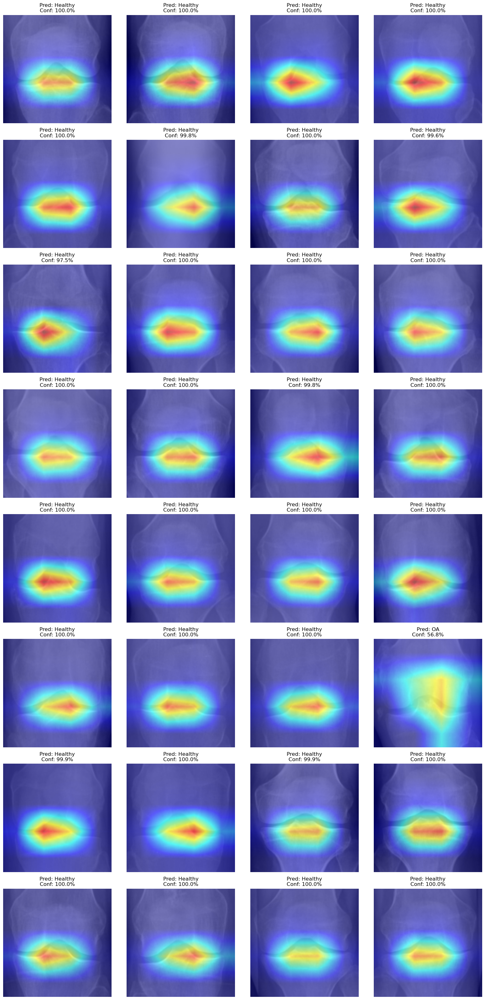

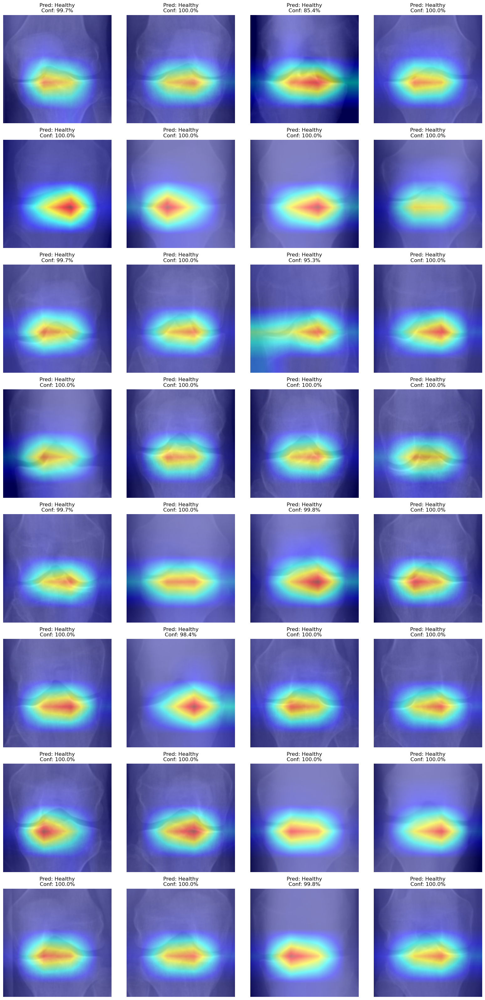

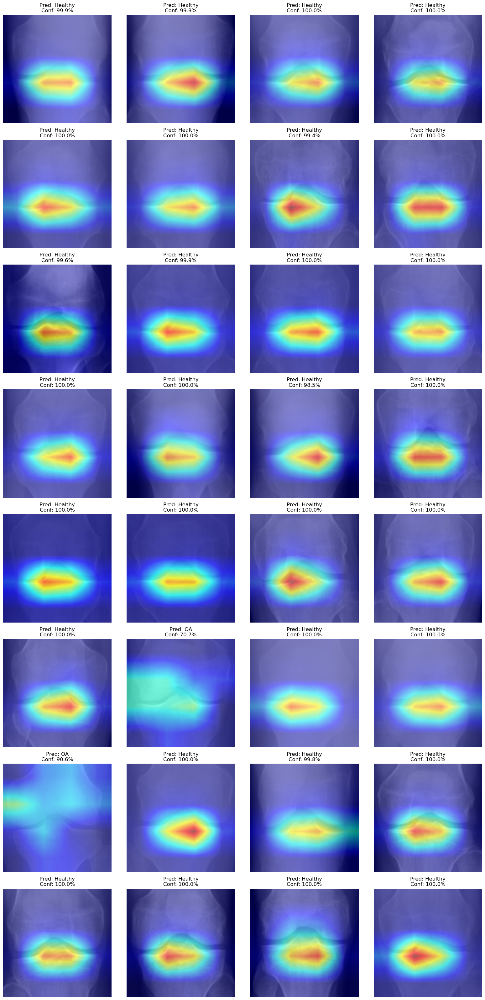

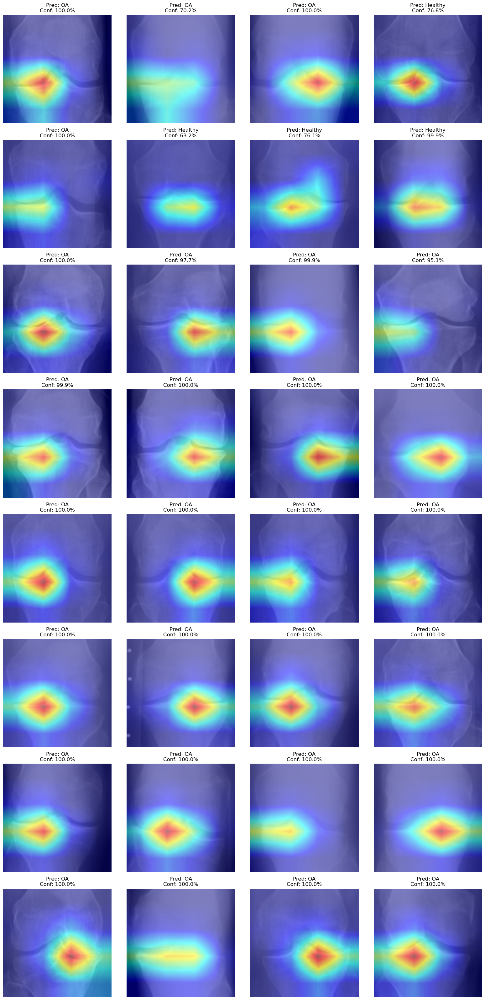

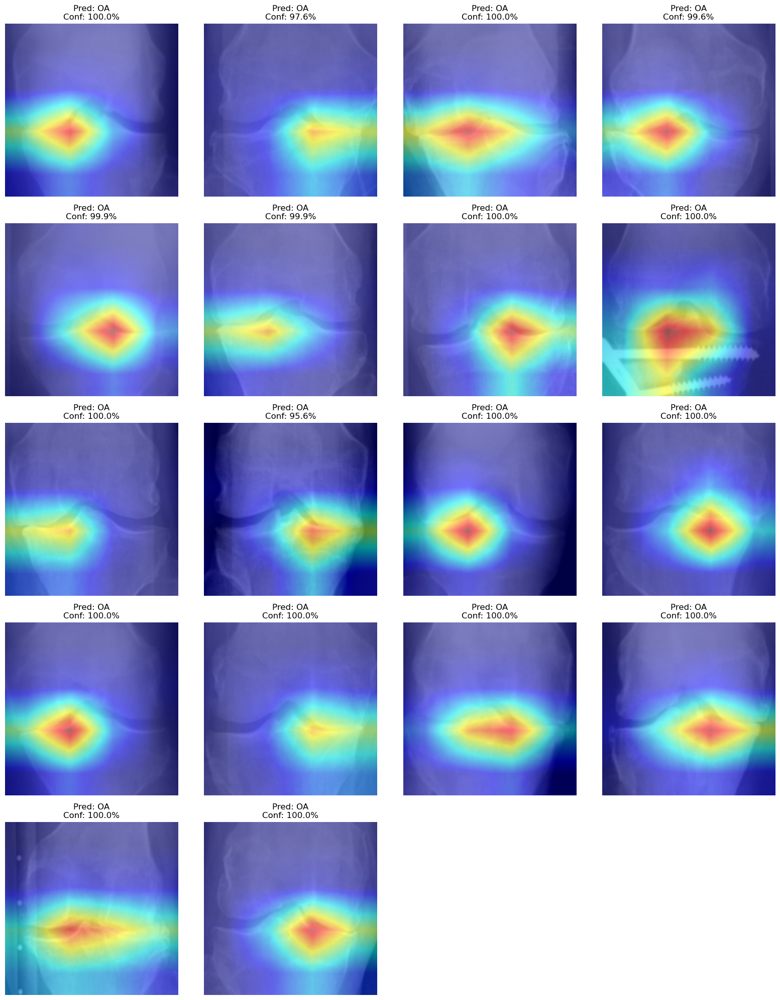

In [139]:
# plots Grad-CAM for every sample
#DO NOT RUN IF YOU VALUE YOUR TIME!!!! (takes a while)
for X, y in test_loader:
    X = X.to(device)
    y = y.to(device)

    logits = model(X)
    probs = torch.sigmoid(logits).squeeze(1).detach().cpu().numpy()
    preds = (probs >= 0.5).astype(int)

    cols = 4
    rows = (len(X) + cols - 1) // cols
    plt.figure(figsize=(16, 4*rows))

    for i in range(len(X)):
        img = X[i].cpu()
        label = y[i].item()
        pred = preds[i]
        conf = probs[i]

        cam, _ = get_cam(img)

        plt.subplot(rows, cols, i + 1)
        show_cam(img, cam)

        class_name = "Healthy" if label == 0 else "OA"
        pred_name = "Healthy" if pred == 0 else "OA"
        confidence = 100-conf*100 if pred == 0 else conf*100

        plt.title(f"Pred: {pred_name}\nConf: {confidence:.1f}%")

    plt.tight_layout()
    plt.show()

When comparing the heat maps of all the different X-ray images, a clear trend can be noticed where the model seems to focus on a specific part of the image where the knee joint usually is. In some cases, the model is also confused by some artifacts that might be present. Where the model does have the right "reasoning" is that is often focusses on the space between the two bones, where osteoarthritis can be detected, often focussing on the right or left side of the knee. Looking closer at why this might be, it seems that it focusses on where the space between the bones is the smallest, which is a big indicator for osteoarthritis diagnosis.


From a clinical perspective, the Grad-CAM results indicate that the model generally focuses on anatomically relevant regions, particularly the knee joint space between the femur and tibia. This region is clinically important, as narrowing of the joint space is a key indicator of osteoarthritis severity.

In many cases, the highlighted regions align well with medically meaningful structures, suggesting that the model is learning relevant radiographic features rather than relying purely on global image statistics.

However, there are also some instances where the model is "distracted" on irrelevant regions or image artifacts, like implants or background features. These cases suggest that the model is still sensitive to unexpected artifacts.